In [1]:
# Import libraries
import torch
import os
import pandas as pd
import numpy as np
import cv2
import torchvision.models as models
from PIL import Image
from torchvision.transforms.functional import normalize
from transformers import Data2VecTextConfig, Data2VecTextModel, RobertaTokenizer
from transformers import RobertaTokenizer
from transformers import AutoFeatureExtractor, ResNetModel
from sklearn.metrics.pairwise import cosine_similarity
from xml.etree import ElementTree
from torchvision import transforms
from PIL import Image

In [2]:
# Configure folders
train_path="train"
evaluation_path="eval"

## Data2vec

In [3]:
# Instantiate a Data2VecText model
# Initializing a Data2VecText facebook/data2vec-text-base style configuration
configuration = Data2VecTextConfig()

# Initializing a model (with random weights) from the facebook/data2vec-text-base style configuration
model = Data2VecTextModel(configuration)

# Accessing the model configuration
configuration = model.config

In [4]:
# Show facebook/data2vec-text-base style configuration
configuration

Data2VecTextConfig {
  "attention_probs_dropout_prob": 0.1,
  "bos_token_id": 0,
  "classifier_dropout": null,
  "eos_token_id": 2,
  "hidden_act": "gelu",
  "hidden_dropout_prob": 0.1,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": 3072,
  "layer_norm_eps": 1e-12,
  "max_position_embeddings": 512,
  "model_type": "data2vec-text",
  "num_attention_heads": 12,
  "num_hidden_layers": 12,
  "pad_token_id": 1,
  "position_embedding_type": "absolute",
  "transformers_version": "4.25.1",
  "type_vocab_size": 2,
  "use_cache": true,
  "vocab_size": 30522
}

In [5]:
# Show model configuration
model

Data2VecTextModel(
  (embeddings): Data2VecTextForTextEmbeddings(
    (word_embeddings): Embedding(30522, 768, padding_idx=1)
    (position_embeddings): Embedding(512, 768, padding_idx=1)
    (token_type_embeddings): Embedding(2, 768)
    (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
    (dropout): Dropout(p=0.1, inplace=False)
  )
  (encoder): Data2VecTextEncoder(
    (layer): ModuleList(
      (0): Data2VecTextLayer(
        (attention): Data2VecTextAttention(
          (self): Data2VecTextSelfAttention(
            (query): Linear(in_features=768, out_features=768, bias=True)
            (key): Linear(in_features=768, out_features=768, bias=True)
            (value): Linear(in_features=768, out_features=768, bias=True)
            (dropout): Dropout(p=0.1, inplace=False)
          )
          (output): Data2VecTextSelfOutput(
            (dense): Linear(in_features=768, out_features=768, bias=True)
            (LayerNorm): LayerNorm((768,), eps=1e-12, elementwis

## Tokenize annotations

In [6]:
# Tokenize using Roberta tokenizer
tokenizer = RobertaTokenizer.from_pretrained("facebook/data2vec-text-base")
model = Data2VecTextModel.from_pretrained("facebook/data2vec-text-base")

# Try to tokenize random text
inputs = tokenizer("Hello, my dog is cute", return_tensors="pt")
outputs = model(**inputs)

last_hidden_states = outputs.last_hidden_state

Some weights of the model checkpoint at facebook/data2vec-text-base were not used when initializing Data2VecTextModel: ['lm_head.dense.weight', 'lm_head.dense.bias', 'lm_head.layer_norm.bias', 'lm_head.bias', 'lm_head.layer_norm.weight']
- This IS expected if you are initializing Data2VecTextModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing Data2VecTextModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of Data2VecTextModel were not initialized from the model checkpoint at facebook/data2vec-text-base and are newly initialized: ['data2vec_text.pooler.dense.bias', 'data2vec_text.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it f

In [7]:
# Print out the outputs
outputs

BaseModelOutputWithPoolingAndCrossAttentions(last_hidden_state=tensor([[[ 0.2231, -0.0399,  0.0260,  ..., -0.0237, -0.1557,  0.1426],
         [-0.0518, -0.2106, -0.2173,  ..., -0.0805,  0.0258,  0.0625],
         [-0.0539, -0.2075, -0.2161,  ..., -0.0765,  0.0276,  0.0643],
         ...,
         [ 0.2234, -0.0339,  0.0308,  ..., -0.0336, -0.1677,  0.1489],
         [-0.0485, -0.2104, -0.2161,  ..., -0.0834,  0.0248,  0.0626],
         [ 0.2031, -0.0625,  0.0670,  ...,  0.1327, -0.0643,  0.0273]]],
       grad_fn=<NativeLayerNormBackward0>), pooler_output=tensor([[-6.2666e-02,  1.6555e-01,  2.6198e-01, -1.1631e-01, -2.5053e-01,
          8.2491e-02, -1.3546e-01,  3.2688e-02,  3.3416e-02,  1.1568e-01,
          8.5322e-02,  4.6219e-02,  5.5390e-03, -7.8667e-02, -4.0817e-01,
          2.0298e-01,  5.5145e-02, -3.0081e-01,  1.1813e-01,  1.3941e-01,
          6.1563e-02, -2.2740e-01,  5.7966e-02, -9.5347e-02,  1.1001e-01,
         -1.8234e-01, -2.5585e-01, -6.6763e-02,  9.9883e-02, -1.075

In [8]:
# Show last hidden states
last_hidden_states

tensor([[[ 0.2231, -0.0399,  0.0260,  ..., -0.0237, -0.1557,  0.1426],
         [-0.0518, -0.2106, -0.2173,  ..., -0.0805,  0.0258,  0.0625],
         [-0.0539, -0.2075, -0.2161,  ..., -0.0765,  0.0276,  0.0643],
         ...,
         [ 0.2234, -0.0339,  0.0308,  ..., -0.0336, -0.1677,  0.1489],
         [-0.0485, -0.2104, -0.2161,  ..., -0.0834,  0.0248,  0.0626],
         [ 0.2031, -0.0625,  0.0670,  ...,  0.1327, -0.0643,  0.0273]]],
       grad_fn=<NativeLayerNormBackward0>)

In [9]:
# Parse through XML files in train folder to create annotations 
#{name.text} [{xmin.text}, {ymin.text}, {xmax.text}, {ymax.text}]
annotations_train = []

for file_name in os.listdir(train_path):
    if file_name.endswith(".xml"):
        file_path = os.path.join(train_path, file_name)
        tree = ElementTree.parse(file_path)
        root = tree.getroot()

        # list to store annotations for the current file
        file_annotations = []

        for obj in root.findall('object'):
            name = obj.find('name')
            bndbox = obj.find('bndbox')
            xmin = bndbox.find('xmin')
            ymin = bndbox.find('ymin')
            xmax = bndbox.find('xmax')
            ymax = bndbox.find('ymax')
            if all(val is not None for val in [name, xmin, ymin, xmax, ymax]):
                object_string = f"{name.text} [{xmin.text}, {ymin.text}, {xmax.text}, {ymax.text}]"
                file_annotations.append(object_string)
        
        # Add annotations to the final list
        file_annotations_string = ', '.join(file_annotations)
        annotations_train.append(file_annotations_string)

print(annotations_train)

['pill [726, 525, 1056, 858], pill_text [850, 645, 979, 735], pill [1287, 465, 1614, 784], pill_text [1405, 590, 1547, 670], pill [1534, 691, 1862, 1023], pill_text [1634, 772, 1758, 900], pill [1252, 881, 1572, 1199], pill_text [1361, 950, 1481, 1066], pill [1609, 1027, 1901, 1347], pill_text [1708, 1130, 1851, 1230], pill [776, 1392, 1110, 1722], pill_text [878, 1516, 1019, 1606], pill [1428, 1320, 1755, 1648], pill_text [1570, 1403, 1649, 1552], pill_text [1142, 1323, 1273, 1415], pill [1376, 1104, 1624, 1377], pill_text [1494, 1178, 1549, 1314], bottle_text [1231, 1567, 1439, 1744], bottle_text [633, 1097, 751, 1339], bottle_text [962, 1085, 1049, 1228], bottle_text [1625, 915, 1868, 1104], bottle_text [1099, 978, 1356, 1232]', 'pill [1000, 737, 1283, 986], pill [859, 942, 1117, 1223], pill [990, 1193, 1275, 1468], pill [1502, 946, 1794, 1229], pill [1546, 652, 1846, 945], pill [745, 1383, 1041, 1680], pill_eng [1031, 798, 1244, 903], pill_eng [1578, 746, 1819, 842], pill_eng [1603

In [10]:
# Parse through XML files in eval folder to create annotations 
#{name.text} [{xmin.text}, {ymin.text}, {xmax.text}, {ymax.text}]folder_path = "eval"
annotations_evaluation = []

for file_name in os.listdir(evaluation_path):
    if file_name.endswith(".xml"):
        file_path = os.path.join(evaluation_path, file_name)
        tree = ElementTree.parse(file_path)
        root = tree.getroot()

        # list to store annotations for the current file
        file_annotations = []

        for obj in root.findall('object'):
            name = obj.find('name')
            bndbox = obj.find('bndbox')
            xmin = bndbox.find('xmin')
            ymin = bndbox.find('ymin')
            xmax = bndbox.find('xmax')
            ymax = bndbox.find('ymax')
            if all(val is not None for val in [name, xmin, ymin, xmax, ymax]):
                object_string = f"{name.text} [{xmin.text}, {ymin.text}, {xmax.text}, {ymax.text}]"
                file_annotations.append(object_string)
        
        # Add annotations to the final list
        file_annotations_string = ', '.join(file_annotations)
        annotations_evaluation.append(file_annotations_string)

print(annotations_evaluation)

['bottle_text [1122, 1008, 1347, 1209], bottle_text [1612, 906, 1876, 1112], bottle_text [627, 1082, 766, 1343], bottle_text [956, 1072, 1049, 1237], bottle_text [1231, 1541, 1451, 1751], pill_text [643, 1263, 797, 1402], pill_text [671, 907, 834, 983], pill_text [763, 717, 917, 790], pill_text [1122, 900, 1195, 1072], pill_text [1434, 1155, 1504, 1312], pill_text [944, 1289, 1076, 1399], pill [709, 608, 1046, 943], pill [542, 844, 884, 1154], pill [564, 1139, 887, 1478], pill [887, 1166, 1200, 1512], pill [1001, 799, 1340, 1129], pill [1316, 1050, 1617, 1360]', 'bottle_text [1096, 967, 1360, 1232], bottle_text [1606, 872, 1866, 1072], bottle_text [955, 1078, 1061, 1240], bottle_text [624, 1118, 763, 1378], bottle_text [1261, 1542, 1477, 1741], pill_eng [1246, 490, 1460, 718], pill_eng [1619, 1122, 1750, 1362], pill_eng [1367, 1332, 1527, 1543], pill [1204, 456, 1499, 756], pill [1537, 1087, 1846, 1385], pill [1344, 1274, 1614, 1565]', 'bottle_text [1110, 969, 1357, 1213], bottle_text 

In [11]:
# Generate the embeddings from the annotations_train
text_embeddings = []

for annotation in annotations_train:
    inputs = tokenizer(annotation, return_tensors="pt", padding="max_length", max_length = 512, 
                       truncation = True)
    outputs = model(**inputs)
    embedding = outputs.pooler_output.detach()
    text_embeddings.append(embedding)
    
    # Show the shape of the pooler_output
    print(outputs.pooler_output.shape)

torch.Size([1, 768])
torch.Size([1, 768])
torch.Size([1, 768])
torch.Size([1, 768])
torch.Size([1, 768])
torch.Size([1, 768])
torch.Size([1, 768])
torch.Size([1, 768])
torch.Size([1, 768])
torch.Size([1, 768])
torch.Size([1, 768])
torch.Size([1, 768])
torch.Size([1, 768])
torch.Size([1, 768])
torch.Size([1, 768])
torch.Size([1, 768])
torch.Size([1, 768])
torch.Size([1, 768])
torch.Size([1, 768])
torch.Size([1, 768])


In [12]:
text_embeddings[0]

tensor([[-1.1119e-01,  9.6729e-02,  2.5499e-01, -1.2680e-01, -3.4708e-01,
          8.1643e-02, -2.2514e-01,  3.0649e-02,  1.3462e-01,  3.4672e-02,
          1.0873e-01, -2.9059e-02,  5.2855e-02, -4.5006e-02, -4.3288e-01,
          2.2895e-01,  6.7153e-02, -8.4703e-02,  1.5820e-01,  1.9983e-01,
         -8.0863e-02, -2.6175e-01,  8.9826e-02, -9.9558e-02, -1.2994e-02,
         -3.3295e-01, -1.4460e-01, -1.7428e-01, -2.4281e-03, -2.0236e-01,
         -1.4730e-02,  2.9125e-03, -6.3575e-02, -3.3776e-02,  9.5212e-02,
          4.8306e-02, -2.5810e-01, -1.4032e-01, -1.2386e-01,  1.8306e-01,
         -1.2450e-02,  6.9376e-02,  1.6676e-01,  8.4519e-02, -8.6575e-02,
         -2.0627e-01, -1.7466e-01, -3.3719e-01, -1.8569e-01, -1.2384e-01,
          8.6135e-02, -5.0221e-02, -3.5100e-01,  3.2391e-01, -3.7027e-01,
          3.2258e-01, -3.7660e-01, -2.0743e-01,  1.5284e-01, -3.9428e-02,
         -1.0795e-01,  2.0977e-01,  3.8976e-01, -1.6235e-01, -3.1727e-02,
          4.2686e-03,  2.2327e-01,  2.

## Cosine similarity

In [13]:
# Cosine similarity for text_embeddings (0,1)
cosine_similarity(text_embeddings[0], text_embeddings[1])

array([[0.997835]], dtype=float32)

In [14]:
# Cosine similarity for text_embeddings (4,5)
cosine_similarity(text_embeddings[4], text_embeddings[5])

array([[0.9880692]], dtype=float32)

## Tokenize images 

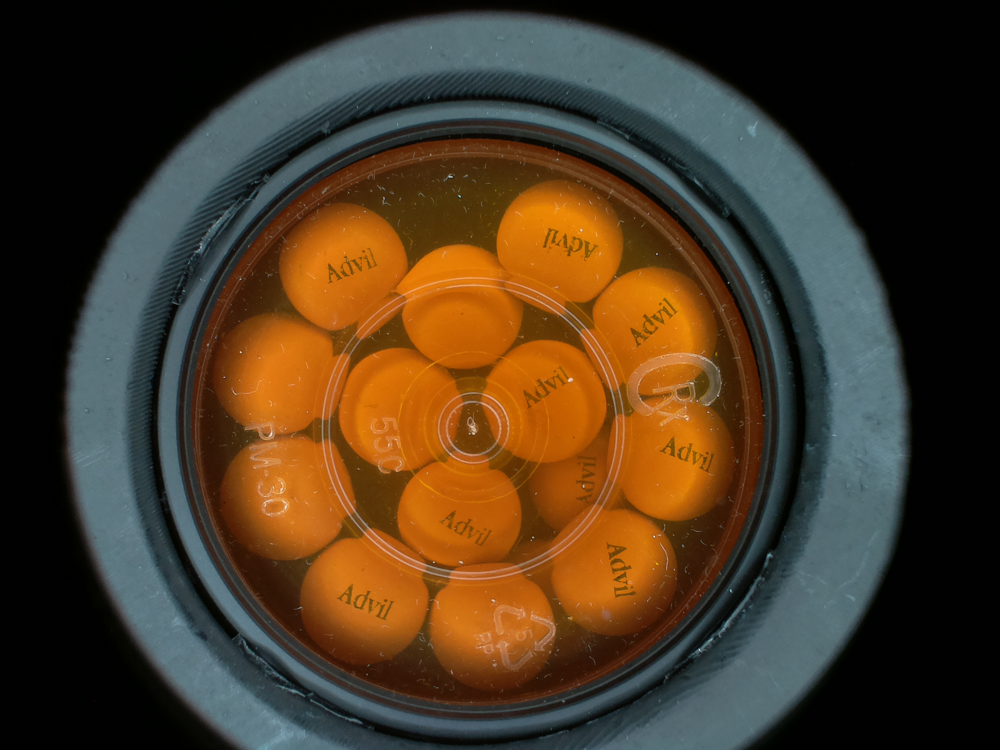

In [15]:
# Get the list of XML and IMG files
xml_files = [file for file in os.listdir(train_path) if file.endswith(".xml")]
img_files = [file.replace(".xml",".png") for file in xml_files]

# Print out first image
image = Image.open(os.path.join(train_path, img_files[0]))
image

In [16]:
# define a dictionary to store the colors for different object names
colors = {'pill': (0, 255, 0), 'bottle_text': (255, 0, 255), 'pill_text':(255, 255, 0)}

def get_annotated_image(image_number):
    # check if the index is within range
    if len(xml_files) > image_number:
        # get the xml file path and image file path
        xml_file_path = os.path.join(train_path, xml_files[image_number])
        img_file_path = os.path.join(train_path, img_files[image_number])
        if os.path.exists(img_file_path):
            # parse the xml file
            tree = ElementTree.parse(xml_file_path)
            root = tree.getroot()
            img = cv2.imread(img_file_path)
            #iterate over objects
            for obj in root.findall('object'):
                name = obj.find('name').text
                bndbox = obj.find('bndbox')
                xmin = int(bndbox.find('xmin').text)
                ymin = int(bndbox.find('ymin').text)
                xmax = int(bndbox.find('xmax').text)
                ymax = int(bndbox.find('ymax').text)
                # check if the object name is in the colors dictionary
                if name in colors:
                    color = colors[name]
                    cv2.rectangle(img, (xmin, ymin), (xmax, ymax), color, 2)
            return img
        else:
            print(f"The corresponding image for {xml_file_name} was not found.")
            return None
    else:
        print(f"Index out of range.")
        return None

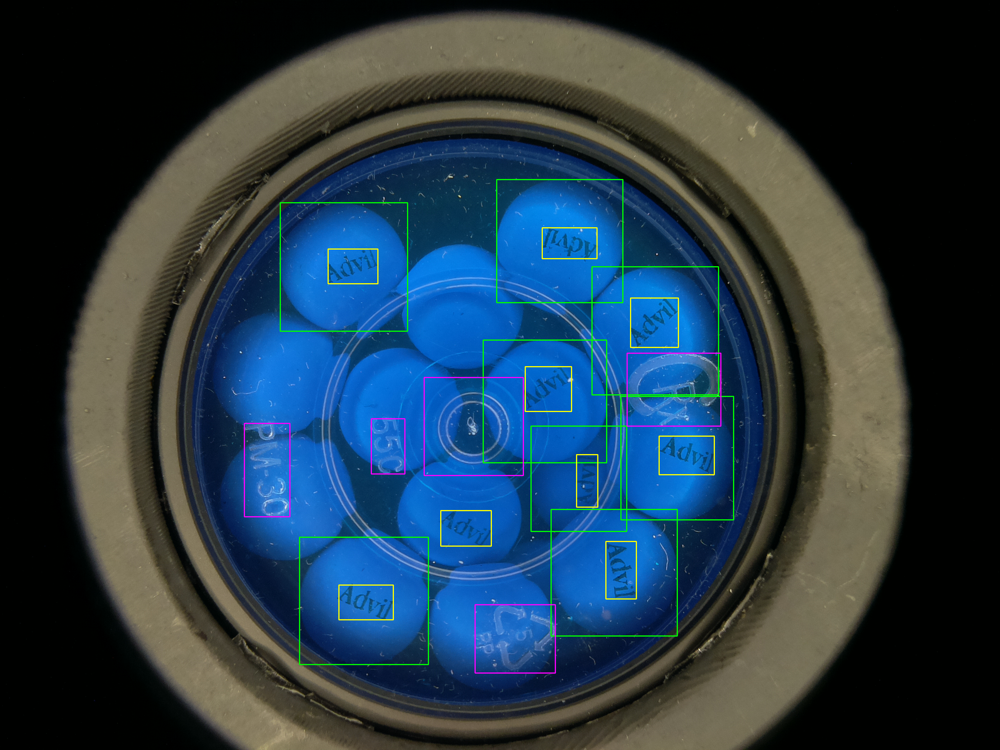

In [17]:
annotated_image = get_annotated_image(0)
im = Image.fromarray(annotated_image)
display(im)

In [19]:
# Initialize FeatureExtractor
feature_extractor = AutoFeatureExtractor.from_pretrained("microsoft/resnet-50")

# Initialize pretrained ResNetModel
model = ResNetModel.from_pretrained("microsoft/resnet-50")

Some weights of the model checkpoint at microsoft/resnet-50 were not used when initializing ResNetModel: ['classifier.1.bias', 'classifier.1.weight']
- This IS expected if you are initializing ResNetModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing ResNetModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


In [20]:
# Define a dictionary to store the embeddings
embeddings_train = []

# Loop through the images in the folder
folder_path = "train"
for file_name in os.listdir(folder_path):
    if file_name.endswith(("png")):
        file_path = os.path.join(folder_path, file_name)
        # Open and preprocess the image
        img = Image.open(file_path)
        inputs = feature_extractor(img.convert("RGB"), return_tensors="pt")
        with torch.no_grad():
            outputs = model(**inputs)
        img_embedding = outputs.pooler_output
        # Add the embedding to the dictionary
        embeddings_train.append(img_embedding)

In [21]:
embeddings_train

[tensor([[[[0.0000]],
 
          [[0.0693]],
 
          [[0.0000]],
 
          ...,
 
          [[0.4312]],
 
          [[0.0080]],
 
          [[0.0000]]]]),
 tensor([[[[0.0102]],
 
          [[0.0574]],
 
          [[0.0000]],
 
          ...,
 
          [[0.6509]],
 
          [[0.0073]],
 
          [[0.0000]]]]),
 tensor([[[[0.0000]],
 
          [[0.0853]],
 
          [[0.0000]],
 
          ...,
 
          [[0.7348]],
 
          [[0.0101]],
 
          [[0.0000]]]]),
 tensor([[[[0.0000]],
 
          [[0.0663]],
 
          [[0.0000]],
 
          ...,
 
          [[1.1611]],
 
          [[0.0067]],
 
          [[0.0000]]]]),
 tensor([[[[0.0000]],
 
          [[0.1118]],
 
          [[0.0000]],
 
          ...,
 
          [[0.4135]],
 
          [[0.0072]],
 
          [[0.0000]]]]),
 tensor([[[[0.0557]],
 
          [[0.0763]],
 
          [[0.0000]],
 
          ...,
 
          [[1.3128]],
 
          [[0.0026]],
 
          [[0.0041]]]]),
 tensor([[[[0.0000]],
 
    

In [22]:
embeddings_train[0].shape

torch.Size([1, 2048, 1, 1])